<a href="https://colab.research.google.com/github/rafael-ariascalles/Deep-Q-Network-pytorch/blob/master/Travel_Package_Purchase_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
!pip install pandas-profiling==2.7.1

# Libraries

In [174]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import pandas_profiling 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier,RandomForestClassifier,GradientBoostingClassifier,StackingClassifier,AdaBoostClassifier
from xgboost import XGBClassifier

In [35]:
#Pandas format for decimals
pd.options.display.float_format = "{:,.2f}".format
#Display of the ipynb 
from IPython.core.display import display,HTML
display(HTML("<style>.container{width:100% !important;}</style>"))

# Business Objective

A company is planning to launch a new product i.e. Wellness Tourism Package. Wellness Tourism is defined as Travel that allows the traveler to maintain, enhance or kick-start a healthy lifestyle, and support or increase one's sense of well being.

it is needed to:

* Give recommendations to the Policy Maker and Marketing Team for the newly package

* Build a model to predict the potential customer who is going to purchase the newly introduced package

# Explore and Process Data

### Data Source and Data Understanding 

In [42]:
data = pd.read_excel("drive/MyDrive/PGP-AIML/Tourism.xlsx",sheet_name=1)

In [4]:
def data_understanding(df):
    n_rows, n_columns = df.shape
    print("------------ SAMPLE DATA ----------------------")
    display(data.sample(10).head())
    print("Number of Columns: {} and Rows: {}".format(n_columns,n_rows))
    print("------------ INFORMATION ----------------------")
    print(df.info())
    print("------------ NUMERIC TYPE ---------------------")
    dm = df.describe()
    display(dm)
    print(dm.columns)
    print("------------ OBJECT TYPE ----------------------")
    dc = df.describe(include=["O"])
    display(dc)
    print(dc.columns)

In [5]:
data_understanding(data)

------------ SAMPLE DATA ----------------------


,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisited,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,Designation,MonthlyIncome
1434,201434,0,NaN,Company Invited,3,126.0,Salaried,Male,2,3.0,Basic,3.0,Married,3.0,0,1,1,1.0,Executive,18482.0
1899,201899,0,46.0,Self Enquiry,1,8.0,Salaried,Male,2,3.0,Super Deluxe,3.0,Married,7.0,0,5,1,0.0,AVP,32861.0
462,200462,0,34.0,Self Enquiry,3,27.0,Salaried,Male,3,2.0,Deluxe,3.0,Single,2.0,0,3,1,0.0,Manager,20337.0
4050,204050,1,52.0,Company Invited,1,15.0,Salaried,Male,3,6.0,Standard,3.0,Single,4.0,0,1,1,1.0,Senior Manager,29328.0
1884,201884,1,24.0,Self Enquiry,3,6.0,Large Business,Female,3,3.0,Basic,4.0,Single,2.0,1,4,0,0.0,Executive,18202.0


Number of Columns: 20 and Rows: 4888
------------ INFORMATION ----------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CustomerID               4888 non-null   int64  
 1   ProdTaken                4888 non-null   int64  
 2   Age                      4662 non-null   float64
 3   TypeofContact            4863 non-null   object 
 4   CityTier                 4888 non-null   int64  
 5   DurationOfPitch          4637 non-null   float64
 6   Occupation               4888 non-null   object 
 7   Gender                   4888 non-null   object 
 8   NumberOfPersonVisited    4888 non-null   int64  
 9   NumberOfFollowups        4843 non-null   float64
 10  ProductPitched           4888 non-null   object 
 11  PreferredPropertyStar    4862 non-null   float64
 12  MaritalStatus            4888 non-null   object

,CustomerID,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisited,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,MonthlyIncome
count,4888.000000,4888.000000,4662.000000,4888.000000,4637.000000,4888.000000,4843.000000,4862.000000,4748.000000,4888.000000,4888.000000,4888.000000,4822.000000,4655.000000
mean,202443.500000,0.188216,37.622265,1.654255,15.490835,2.905074,3.708445,3.581037,3.236521,0.290917,3.078151,0.620295,1.187267,23619.853491
std,1411.188388,0.390925,9.316387,0.916583,8.519643,0.724891,1.002509,0.798009,1.849019,0.454232,1.365792,0.485363,0.857861,5380.698361
min,200000.000000,0.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000
25%,201221.750000,0.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20346.000000
50%,202443.500000,0.000000,36.000000,1.000000,13.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22347.000000
75%,203665.250000,0.000000,44.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25571.000000
max,204887.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,5.000000,1.000000,3.000000,98678.000000


Index(['CustomerID', 'ProdTaken', 'Age', 'CityTier', 'DurationOfPitch',
       'NumberOfPersonVisited', 'NumberOfFollowups', 'PreferredPropertyStar',
       'NumberOfTrips', 'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisited', 'MonthlyIncome'],
      dtype='object')
------------ OBJECT TYPE ----------------------


,TypeofContact,Occupation,Gender,ProductPitched,MaritalStatus,Designation
count,4863,4888,4888,4888,4888,4888
unique,2,4,3,5,4,5
top,Self Enquiry,Salaried,Male,Basic,Married,Executive
freq,3444,2368,2916,1842,2340,1842


Index(['TypeofContact', 'Occupation', 'Gender', 'ProductPitched',
       'MaritalStatus', 'Designation'],
      dtype='object')


### Exploratory Data Analysis

it will be use Pandas Profile Report to do an univariate EDA.



In [ ]:
baseline_report = pandas_profiling.ProfileReport(data)

In [ ]:
%%capture
baseline_report.to_file("output.html")

In [ ]:
baseline_report.to_notebook_iframe()

The dataset has 9 Categorical variables , 8 Numeric variable and 3 Boolean Variables.

#### Regards Missing Values

Age, Duration Of Pitch,Number of trips,Number of Children Visited and Monthly Income have missing values.
in these case given that we will try to find a Persona that want to buy the new product we will drop the lines that has missing values.

#### Regrads Highly Correlated variables

the Product Pitched is higly correlated to the Designation of the customer,
these is normal given that the type of product are pitch given a profile of the customer.
in these case given that it is been looking for a specific type of customer with fitness in mind it should be necesary to understand 

#### Regards every variable

* Gender have to be done a Quality check given that is has "Fe Male" instead of Female. It is assume that is female.
* 47% of the customer database is Married.
* Customer tends to visitd in groups of 2 to 3 Persons. 
* there is normally more that 1 Follow up.
* Basic and Deluxes are the most Pitches products
* PitchSatisfactionScore is normale 3 Starts
* We could have outliers in Number of trips so it will be Cap to 8.

Some interaction could be between all numeric variable with Product Taken, and the separation between Designation. 



In [10]:
data.columns

Index(['CustomerID', 'ProdTaken', 'Age', 'TypeofContact', 'CityTier',
       'DurationOfPitch', 'Occupation', 'Gender', 'NumberOfPersonVisited',
       'NumberOfFollowups', 'ProductPitched', 'PreferredPropertyStar',
       'MaritalStatus', 'NumberOfTrips', 'Passport', 'PitchSatisfactionScore',
       'OwnCar', 'NumberOfChildrenVisited', 'Designation', 'MonthlyIncome'],
      dtype='object')

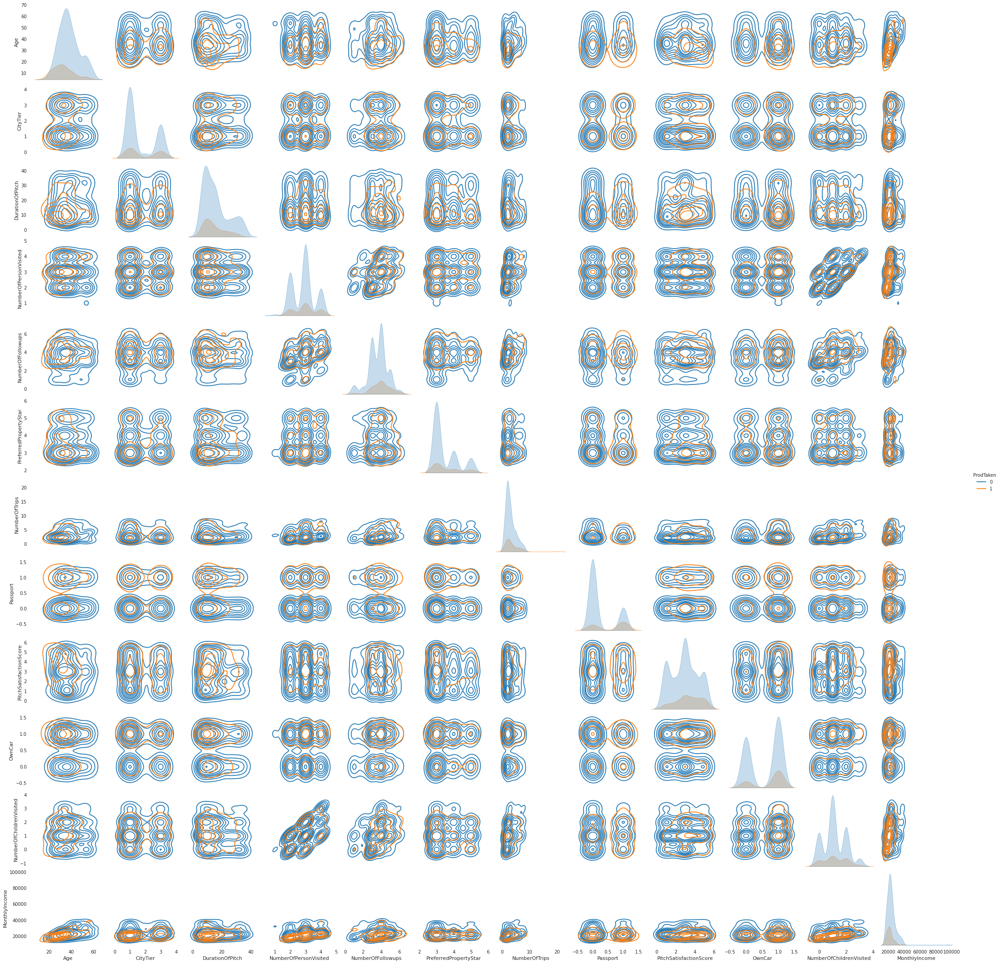

In [13]:
sns.pairplot(data.drop("CustomerID",1).sample(500),kind="kde",hue="ProdTaken")

In [43]:
data = data.dropna()

In [47]:
data = data.reset_index(drop=True)

In [48]:
target = "ProdTaken"

numeric_variables = [
    "Age",
    "DurationOfPitch",
    "NumberOfPersonVisited",
    "NumberOfFollowups",
    "NumberOfTrips",
    "PitchSatisfactionScore",
    "MonthlyIncome"
]

categorical_variables = [c for c in data.drop(["CustomerID","ProductPitched"],1).columns if c not in numeric_variables+[target]]

### Data Preprocessing

In [49]:
categorical_encoder = {}

for name in categorical_variables:
    encoder = OneHotEncoder(handle_unknown='error',drop="first",sparse=False)
    encoder.fit(data.loc[:,[name]])
    categorical_encoder[name] = encoder

In [50]:
features_list = []
features_list.append(data[numeric_variables])

for name in categorical_variables:
    encoder = categorical_encoder[name]
    columns_name = [x.replace("x0",name) for x in encoder.get_feature_names()]
    encoded = encoder.transform(data.loc[:,[name]])
    features = pd.DataFrame(encoded,columns=columns_name)
    features_list.append(features)

In [51]:
features = pd.concat(features_list,1)

In [53]:
scaler = MinMaxScaler()

In [54]:
X = scaler.fit_transform(features)

In [55]:
y = np.array(data[target])

In [56]:
x_train,x_test,y_train,y_test =  train_test_split(X,y,test_size=0.3,random_state=1230)

# Model building

#### Bagging

In [152]:
dtc = DecisionTreeClassifier(criterion='gini',class_weight={0:0.10,1:0.90},random_state=85,min_samples_leaf=20,ccp_alpha=0.005,max_depth=6)

In [162]:
bc = BaggingClassifier(random_state=50)

In [165]:
rf = RandomForestClassifier(random_state=100)

### Model Training

In [166]:
dtc.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.005, class_weight={0: 0.1, 1: 0.9},
                       criterion='gini', max_depth=6, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=20,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=85, splitter='best')

In [167]:
bc.fit(x_train, y_train)

BaggingClassifier(base_estimator=None, bootstrap=True, bootstrap_features=False,
                  max_features=1.0, max_samples=1.0, n_estimators=10,
                  n_jobs=None, oob_score=False, random_state=50, verbose=0,
                  warm_start=False)

In [168]:
rf.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=100,
                       verbose=0, warm_start=False)

In [169]:
y_hat = dtc.predict(x_test)
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           0       0.90      0.49      0.63       987
           1       0.28      0.78      0.41       252

    accuracy                           0.55      1239
   macro avg       0.59      0.63      0.52      1239
weighted avg       0.77      0.55      0.59      1239



In [170]:
y_hat = bc.predict(x_test)
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94       987
           1       0.90      0.56      0.69       252

    accuracy                           0.90      1239
   macro avg       0.90      0.77      0.82      1239
weighted avg       0.90      0.90      0.89      1239



In [171]:
y_hat = rf.predict(x_test)
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           0       0.89      0.99      0.94       987
           1       0.94      0.53      0.68       252

    accuracy                           0.90      1239
   macro avg       0.91      0.76      0.81      1239
weighted avg       0.90      0.90      0.88      1239



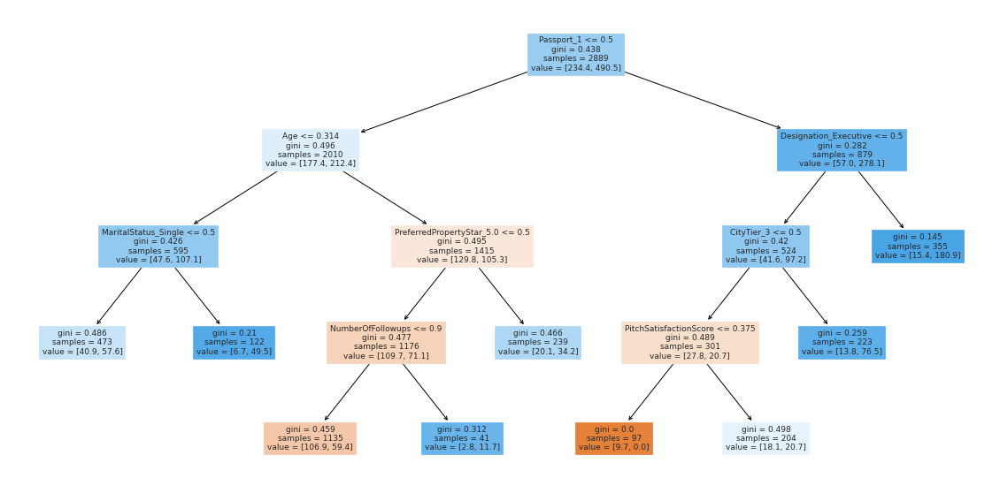

In [159]:
plt.figure(figsize=(20,10))
out = tree.plot_tree(dtc,feature_names=features.columns,filled=True,fontsize=9,node_ids=False,class_names=None,)
#below code will add arrows to the decision tree split if they are missing
for o in out:
     arrow = o.arrow_patch
     if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

### Model Evaluation

In these case the most accurate metric it would be the precision with the F1 Score, given that we want to reduce cost, better than calling in randomis better to know that the model can detect with good precision potencial clients, despite of not having a good generalization and determination of the patter.

#### Boosting

In [180]:
ada = AdaBoostClassifier(n_estimators=10,learning_rate=0.01)
sm = StackingClassifier([("a",ada),("b",rf),("c",bc)])

In [181]:
xgb = XGBClassifier(max_depth=6,learning_rate=0.001,n_estimators=500)

In [182]:
ada.fit(x_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=0.01,
                   n_estimators=10, random_state=None)

In [183]:
sm.fit(x_train,y_train)

StackingClassifier(cv=None,
                   estimators=[('a',
                                AdaBoostClassifier(algorithm='SAMME.R',
                                                   base_estimator=None,
                                                   learning_rate=0.01,
                                                   n_estimators=10,
                                                   random_state=None)),
                               ('b',
                                RandomForestClassifier(bootstrap=True,
                                                       ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='gini',
                                                       max_depth=None,
                                                       max_features='auto',
                                                       max_leaf_nodes=None,
                                

In [184]:
xgb.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.001, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=None, n_estimators=500, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

# Business Insight

it would be better to use a kind of fast pitch an pitch the product to younger age with a early mariage for the busines development

In [ ]:
#to html in colab
!jupyter nbconvert --to HTML "drive/MyDrive/Colab Notebooks/Travel_Package_Purchase_Prediction.ipynb"